# Visualize ELM Results and Differences In Key Variables
- Purpose: Want to visualize the differences of model outputs

In [1]:
import numpy as np
import xarray as xr
import matplotlib.pyplot as plt
from datetime import datetime, timedelta
from matplotlib.colors import TwoSlopeNorm


print("All modules imported :)")

All modules imported :)


### Function to fix the format of the time in the output netcdfs:

In [10]:
# Make time as "datetime" objects rather than as "cftime" objects, which are more difficult to work with 
def fix_time(data, leapyears = 6):
    # First date in output 
    start = datetime(1939, 10, 1, 0) 
    # Leap days are automatically included when using date times
    times = [start + timedelta(int(i)) for i in np.arange(len(data.time) + leapyears)]
    # Remove leap days 
    times = [t for t in times if ((t.month != 2) | (t.day != 29))]
    data['time'] = times
    return data

### Read in ELM combined outputs:

In [11]:
output_folder = 'ELM_Output_10_years/' #Update path to shrub no-shrub model run outputs 
## for example: '/mnt/output/cime_run_dirs/....' 

baseline = fix_time(xr.open_dataset(output_folder + 'ELM_output_arctic_init_100.nc'), leapyears = 3) ###output of model using standard forcings and a surffile updated with some watershed level characteristics (pft, elevation, etc.)

temp_scale = fix_time(xr.open_dataset(output_folder + 'ELM_output_scale_temp3_100.nc'), leapyears = 3)
rain_snow_scale = fix_time(xr.open_dataset(output_folder +'ELM_output_scale_rain40_snow60_100.nc'), leapyears = 3)
temp_snow_rain_scale = fix_time(xr.open_dataset(output_folder + 'ELM_output_scale_rain40_snow60_temp3_100.nc'), leapyears = 3)

all_shrubs = fix_time(xr.open_dataset(output_folder + 'ELM_output_arctic_init_br25_allshrubs.nc'), leapyears = 3) ###output of model using standard forcings and a 0.5x0.5 deg surffile with shrub pft set to 100% of the land surface
no_shrubs = fix_time(xr.open_dataset(output_folder + 'ELM_output_arctic_init_noshrubs.nc'), leapyears =3) ###output of model using standard forcings and a 0.5x0.5 deg surffile with shrub pft set to 0% of the land surface, meaning all arctic grass

temp_scale_shrubs = fix_time(xr.open_dataset(output_folder + 'ELM_output_scale_temp3_br25_allshrubs.nc'), leapyears = 3) ###output of model using standard forcings and a 0.5x0.5 deg surffile with shrub pft set to 100% of the land surface
temp_scale_no_shrubs = fix_time(xr.open_dataset(output_folder + 'ELM_output_scale_temp3_noshrubs.nc'), leapyears =3) ###output of model using standard forcings and a 0.5x0.5 deg surffile with shrub pft set to 0% of the land surface, meaning all arctic grass

rain_snow_scale_shrubs = fix_time(xr.open_dataset(output_folder + 'ELM_output_scale_rain40_snow60_br25_allshrubs.nc'), leapyears = 3) ###output of model using standard forcings and a 0.5x0.5 deg surffile with shrub pft set to 100% of the land surface
rain_snow_scale_no_shrubs = fix_time(xr.open_dataset(output_folder + 'ELM_output_scale_rain40_snow60_noshrubs.nc'), leapyears =3) ###output of model using standard forcings and a 0.5x0.5 deg surffile with shrub pft set to 0% of the land surface, meaning all arctic grass

temp_scale_rain_snow_scale_shrubs = fix_time(xr.open_dataset(output_folder + 'ELM_output_scale_rain40_snow60_temp3_br25_allshrubs.nc'), leapyears =3) ###output of model using standard forcings and a 0.5x0.5 deg surffile with shrub pft set to 100% of the land surface
temp_scale_rain_snow_scale_no_shrubs = fix_time(xr.open_dataset(output_folder + 'ELM_output_scale_rain40_snow60_temp3_noshrubs.nc'), leapyears=3) ###output of model using standard forcings and a 0.5x0.5 deg surffile with shrub pft set to 0% of the land surface, meaning all arctic grass

### Map ELM naming convention (for user interpretation, and later intuitive plot labeling):

In [7]:
elm_name_map = {"SNOW_DEPTH":"Snow Depth",
               "H2OSNO" : "Snow Water Equivalent",
               'ALT': "Active Layer Thickness",
               "TSOI": "Soil Temperature",
               "GPP": "Gross Primary Productivity",
               "H2OSOI": "Soil Moisture Content",
               "HTOP": "Canopy Height"}

# Plot snow depth

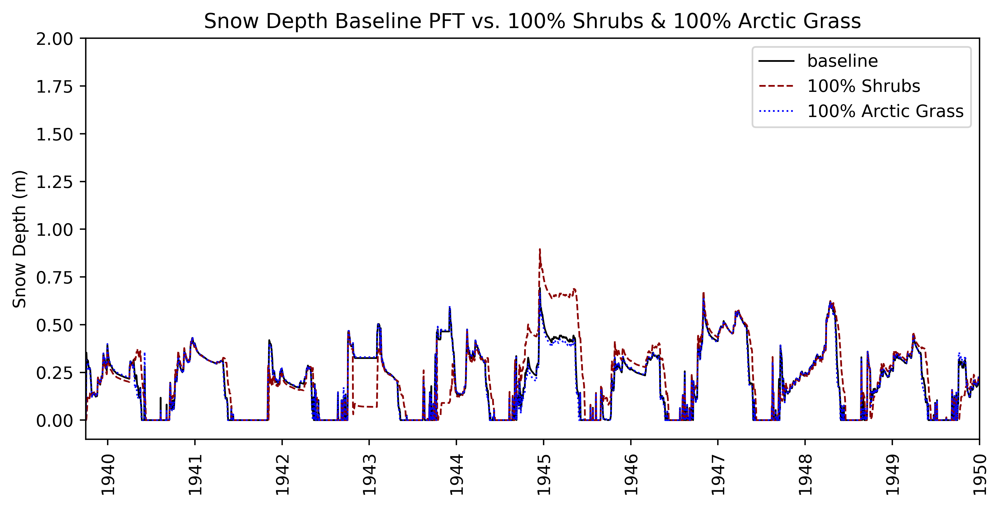

In [12]:
var = 'SNOW_DEPTH'
fig, ax = plt.subplots(1, figsize = [8, 4], dpi = 500, constrained_layout = True)
ax.plot(baseline.time, baseline[var], label = 'baseline', color = 'black', lw = 1, zorder = 1)
ax.plot(all_shrubs.time, all_shrubs[var], label = '100% Shrubs', color= 'darkred', ls = '--', lw = 1, zorder = 2)
ax.plot(no_shrubs.time, no_shrubs[var], label = '100% Arctic Grass', color = 'blue', ls = ':', lw = 1, zorder = 2)
ax.set_ylabel('Snow Depth (m)')
ax.set_ylim([-0.1, 2])
ticks = [datetime(y, 1, 1) for y in np.arange(1940, 1951)]
ax.set_xticks(ticks)
ax.set_xticklabels([d.year for d in ticks], rotation = 90)
ax.set_xlim([datetime(1939, 10, 1), datetime(1950, 1, 1)])
ax.set_title(elm_name_map[var] + " Baseline PFT vs. 100% Shrubs & 100% Arctic Grass")
ax.legend()

## Plot snow depth (basic %100 shrubs, with scaled precip. with scaled temp, with scaled precip. and temp)

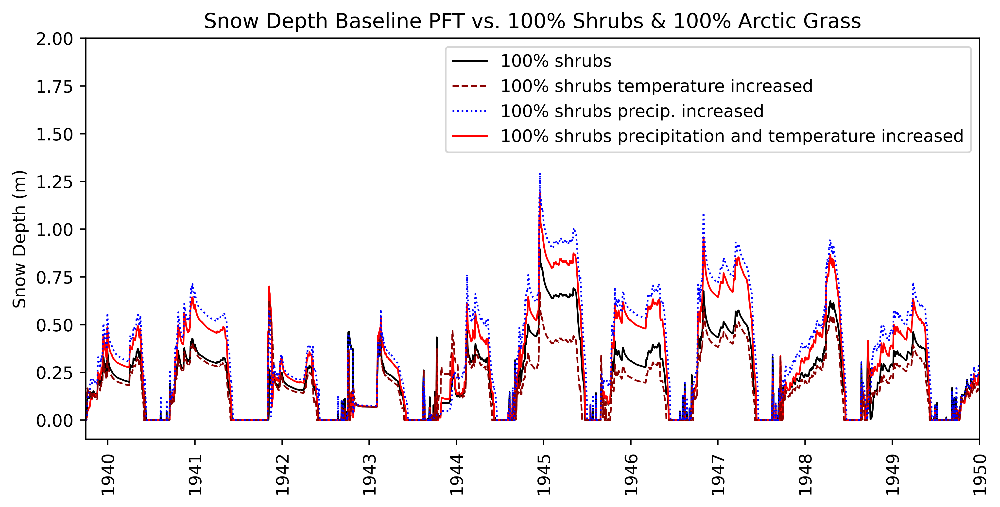

In [13]:
var = 'SNOW_DEPTH'
fig, ax = plt.subplots(1, figsize = [8, 4], dpi = 500, constrained_layout = True)
ax.plot(all_shrubs.time, all_shrubs[var], label = '100% shrubs', color = 'black', lw = 1, zorder = 1)
ax.plot(temp_scale_shrubs.time, temp_scale_shrubs[var], label = '100% shrubs temperature increased', color= 'darkred', ls = '--', lw = 1, zorder = 2)
ax.plot(rain_snow_scale_shrubs.time, rain_snow_scale_shrubs[var], label = '100% shrubs precip. increased', color = 'blue', ls = ':', lw = 1, zorder = 2)
ax.plot(temp_scale_rain_snow_scale_shrubs.time, temp_scale_rain_snow_scale_shrubs[var], label = '100% shrubs precipitation and temperature increased', 
        color = 'red', lw = 1, zorder = 1)
ax.set_ylabel('Snow Depth (m)')
ax.set_ylim([-0.1, 2])
ticks = [datetime(y, 1, 1) for y in np.arange(1940, 1951)]
ax.set_xticks(ticks)
ax.set_xticklabels([d.year for d in ticks], rotation = 90)
ax.set_xlim([datetime(1939, 10, 1), datetime(1950, 1, 1)])
ax.set_title(elm_name_map[var] + " Baseline PFT vs. 100% Shrubs & 100% Arctic Grass")
ax.legend()

## Plot snow depth (basic %100 arctic grass, with scaled precip. with scaled temp, with scaled precip. and temp)

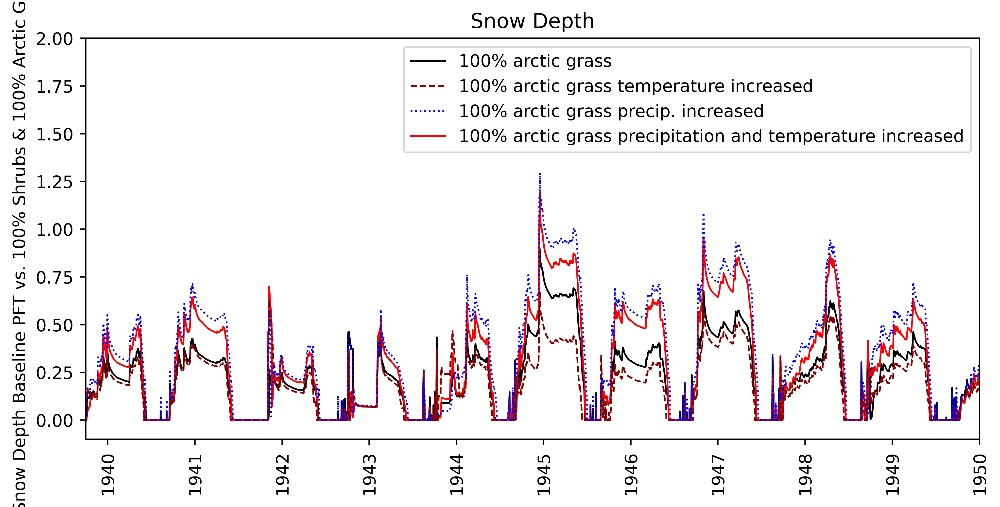

In [14]:
var = 'SNOW_DEPTH'
fig, ax = plt.subplots(1, figsize = [8, 4], dpi = 500, constrained_layout = True)
ax.plot(no_shrubs.time, all_shrubs[var], label = '100% arctic grass', color = 'black', lw = 1, zorder = 1)
ax.plot(temp_scale_no_shrubs.time, temp_scale_shrubs[var], label = '100% arctic grass temperature increased', color= 'darkred', ls = '--', lw = 1, zorder = 2)
ax.plot(rain_snow_scale_no_shrubs.time, rain_snow_scale_shrubs[var], label = '100% arctic grass precip. increased', color = 'blue', ls = ':', lw = 1, zorder = 2)
ax.plot(temp_scale_rain_snow_scale_no_shrubs.time, temp_scale_rain_snow_scale_shrubs[var], label = '100% arctic grass precipitation and temperature increased', 
        color = 'red', lw = 1, zorder = 1)
ax.set_ylabel(elm_name_map[var] + " Baseline PFT vs. 100% Shrubs & 100% Arctic Grass")
ax.set_ylim([-0.1, 2])
ticks = [datetime(y, 1, 1) for y in np.arange(1940, 1951)]
ax.set_xticks(ticks)
ax.set_xticklabels([d.year for d in ticks], rotation = 90)
ax.set_xlim([datetime(1939, 10, 1), datetime(1950, 1, 1)])
ax.set_title(elm_name_map[var])
ax.legend()

# Plot snow water equivalent

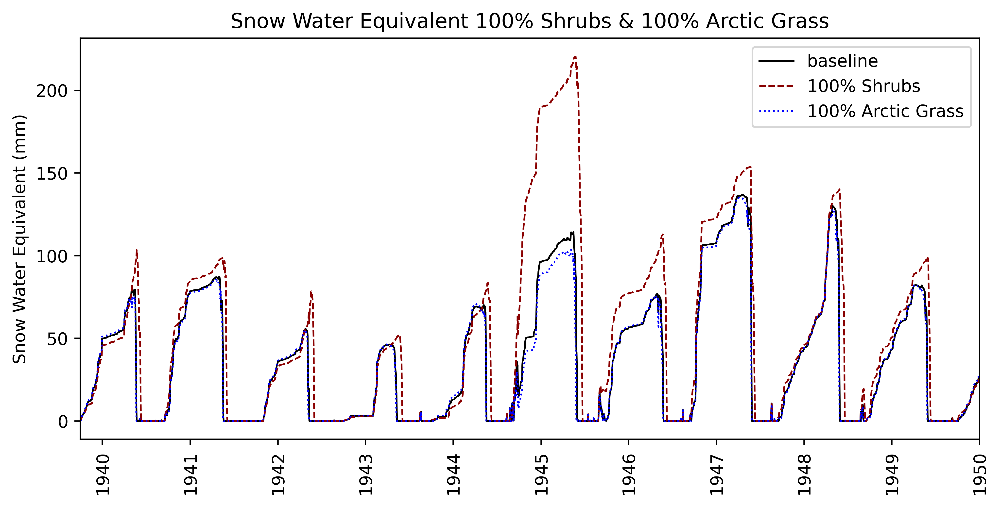

In [15]:
var = 'H2OSNO'
fig, ax = plt.subplots(1, figsize = [8, 4], dpi = 500, constrained_layout = True)
ax.plot(baseline.time, baseline[var], label = 'baseline', color = 'black', lw = 1, zorder = 1)
ax.plot(all_shrubs.time, all_shrubs[var], label = '100% Shrubs', color= 'darkred', ls = '--', lw = 1, zorder = 2)
ax.plot(no_shrubs.time, no_shrubs[var], label = '100% Arctic Grass', color = 'blue', ls = ':', lw = 1, zorder = 2)
ax.set_ylabel('Snow Water Equivalent (mm)')
ticks = [datetime(y, 1, 1) for y in np.arange(1940, 1951)]
ax.set_xticks(ticks)
ax.set_xticklabels([d.year for d in ticks], rotation = 90)
ax.set_xlim([datetime(1939, 10, 1), datetime(1950, 1, 1)])
ax.set_title(elm_name_map[var] + " 100% Shrubs & 100% Arctic Grass")
ax.legend()

## Plot snow water equivalent (basic %100 shrubs, with scaled precip. with scaled temp, with scaled precip. and temp)

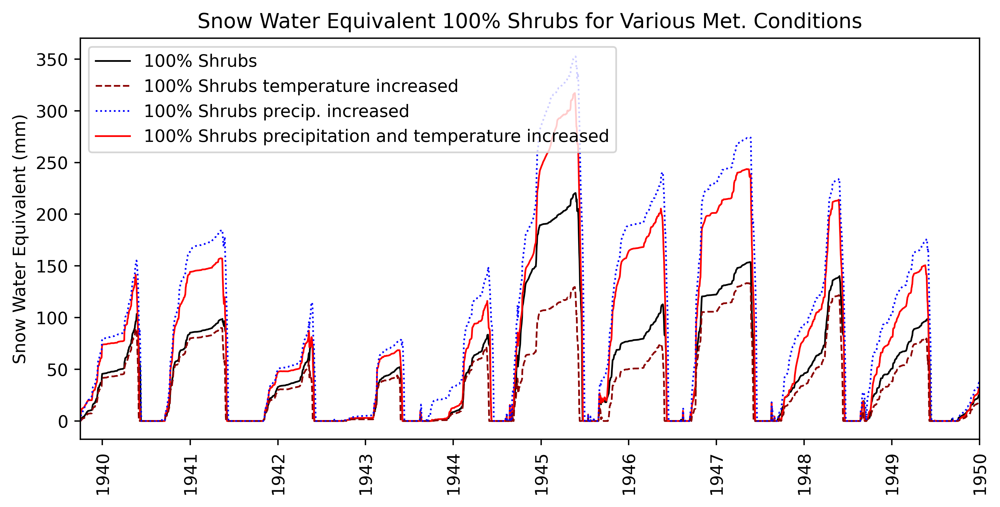

In [16]:
var = 'H2OSNO'
fig, ax = plt.subplots(1, figsize = [8, 4], dpi = 500, constrained_layout = True)
ax.plot(all_shrubs.time, all_shrubs[var], label = '100% Shrubs', color = 'black', lw = 1, zorder = 1)
ax.plot(temp_scale_shrubs.time, temp_scale_shrubs[var], label = '100% Shrubs temperature increased', color= 'darkred', ls = '--', lw = 1, zorder = 2)
ax.plot(rain_snow_scale_shrubs.time, rain_snow_scale_shrubs[var], label = '100% Shrubs precip. increased', color = 'blue', ls = ':', lw = 1, zorder = 2)
ax.plot(temp_scale_rain_snow_scale_shrubs.time, temp_scale_rain_snow_scale_shrubs[var], label = '100% Shrubs precipitation and temperature increased', 
        color = 'red', lw = 1, zorder = 1)
ticks = [datetime(y, 1, 1) for y in np.arange(1940, 1951)]
ax.set_xticks(ticks)
ax.set_xticklabels([d.year for d in ticks], rotation = 90)
ax.set_xlim([datetime(1939, 10, 1), datetime(1950, 1, 1)])
ax.set_ylabel('Snow Water Equivalent (mm)')
ax.set_title(elm_name_map[var] + " 100% Shrubs for Various Met. Conditions")
ax.legend()

## Plot snow water equivalent (basic %100 arctic grass, with scaled precip. with scaled temp, with scaled precip. and temp)

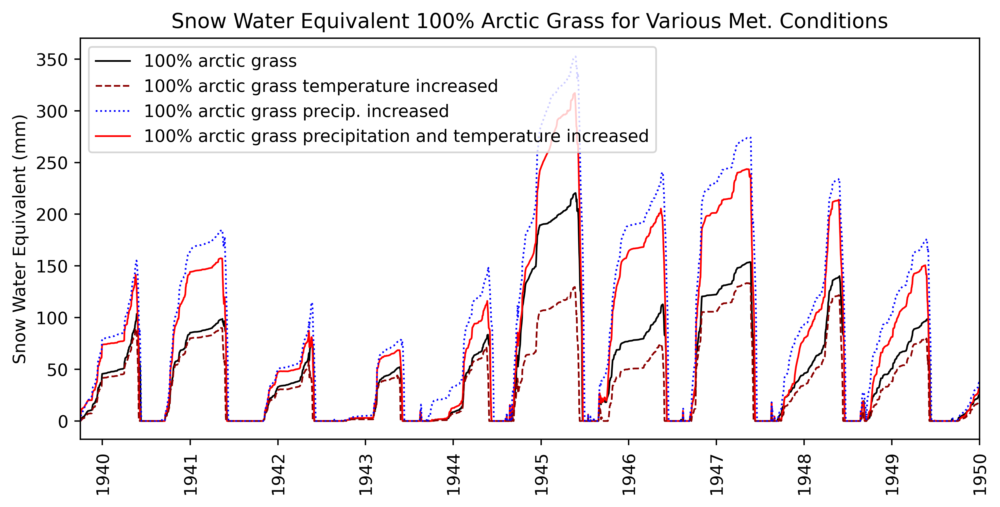

In [17]:
var = 'H2OSNO'
fig, ax = plt.subplots(1, figsize = [8, 4], dpi = 500, constrained_layout = True)
ax.plot(no_shrubs.time, all_shrubs[var], label = '100% arctic grass', color = 'black', lw = 1, zorder = 1)
ax.plot(temp_scale_no_shrubs.time, temp_scale_shrubs[var], label = '100% arctic grass temperature increased', color= 'darkred', ls = '--', lw = 1, zorder = 2)
ax.plot(rain_snow_scale_no_shrubs.time, rain_snow_scale_shrubs[var], label = '100% arctic grass precip. increased', color = 'blue', ls = ':', lw = 1, zorder = 2)
ax.plot(temp_scale_rain_snow_scale_no_shrubs.time, temp_scale_rain_snow_scale_shrubs[var], label = '100% arctic grass precipitation and temperature increased', 
        color = 'red', lw = 1, zorder = 1)
ax.set_ylabel('Snow Water Equivalent (mm)')
ticks = [datetime(y, 1, 1) for y in np.arange(1940, 1951)]
ax.set_xticks(ticks)
ax.set_xticklabels([d.year for d in ticks], rotation = 90)
ax.set_xlim([datetime(1939, 10, 1), datetime(1950, 1, 1)])
ax.set_title(elm_name_map[var] + " 100% Arctic Grass for Various Met. Conditions")
ax.legend()

# Plot active layer thickness

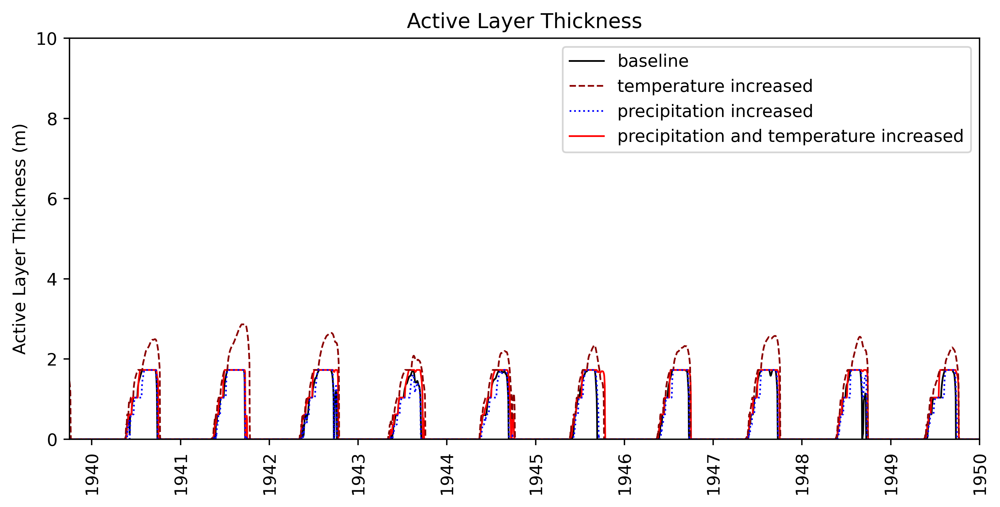

In [18]:
var = 'ALT'
fig, ax = plt.subplots(1, figsize = [8, 4], dpi = 500, constrained_layout = True)
ax.plot(baseline.time, baseline[var], label = 'baseline', color = 'black', lw = 1, zorder = 1)
ax.plot(temp_scale.time, temp_scale[var], label = 'temperature increased', color= 'darkred', ls = '--', lw = 1, zorder = 2)
ax.plot(rain_snow_scale.time, rain_snow_scale[var], label = 'precipitation increased', color = 'blue', ls = ':', lw = 1, zorder = 2)
ax.plot(temp_snow_rain_scale.time, temp_snow_rain_scale[var], label = 'precipitation and temperature increased', 
        color = 'red', lw = 1, zorder = 1)
ticks = [datetime(y, 1, 1) for y in np.arange(1940, 1951)]
ax.set_xticks(ticks)
ax.set_xticklabels([d.year for d in ticks], rotation = 90)
ax.set_xlim([datetime(1939, 10, 1), datetime(1950, 1, 1)])
ax.set_ylim([0, 10])
ax.set_ylabel('Active Layer Thickness (m)')
ax.set_title(elm_name_map[var])
ax.legend()

## Plot active layer thickness (basic %100 shrubs, with scaled precip. with scaled temp, with scaled precip. and temp)

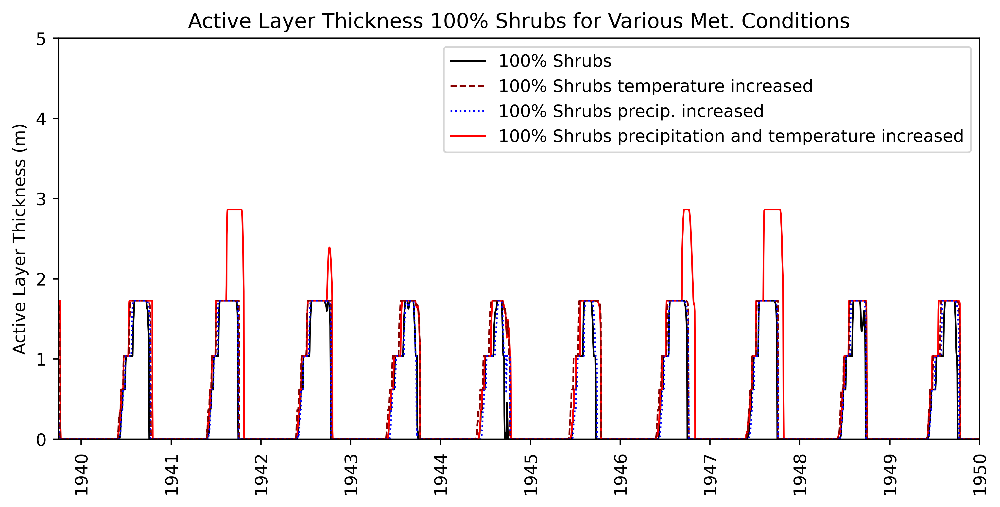

In [19]:
var = 'ALT'
fig, ax = plt.subplots(1, figsize = [8, 4], dpi = 500, constrained_layout = True)
ax.plot(all_shrubs.time, all_shrubs[var], label = '100% Shrubs', color = 'black', lw = 1, zorder = 1)
ax.plot(temp_scale_shrubs.time, temp_scale_shrubs[var], label = '100% Shrubs temperature increased', color= 'darkred', ls = '--', lw = 1, zorder = 2)
ax.plot(rain_snow_scale_shrubs.time, rain_snow_scale_shrubs[var], label = '100% Shrubs precip. increased', color = 'blue', ls = ':', lw = 1, zorder = 2)
ax.plot(temp_scale_rain_snow_scale_shrubs.time, temp_scale_rain_snow_scale_shrubs[var], label = '100% Shrubs precipitation and temperature increased', 
        color = 'red', lw = 1, zorder = 1)
ax.set_ylabel('Active Layer Thickness (m)')
ax.set_title(elm_name_map[var] + " 100% Shrubs for Various Met. Conditions")
ticks = [datetime(y, 1, 1) for y in np.arange(1940, 1951)]
ax.set_xticks(ticks)
ax.set_xticklabels([d.year for d in ticks], rotation = 90)
ax.set_xlim([datetime(1939, 10, 1), datetime(1950, 1, 1)])
ax.set_ylim([0, 5])
ax.legend()

## Plot active layer thickness (basic %100 arctic grass, with scaled precip. with scaled temp, with scaled precip. and temp)

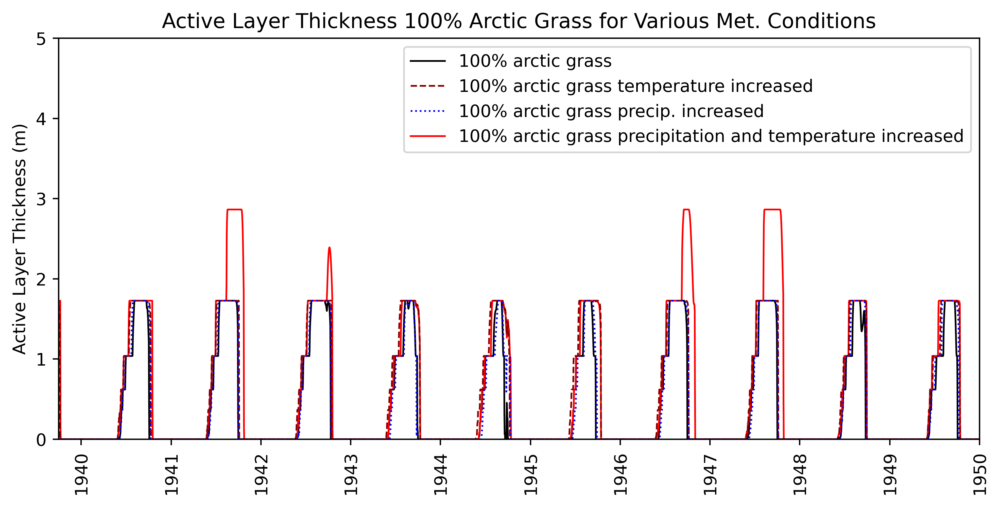

In [20]:
var = 'ALT'
fig, ax = plt.subplots(1, figsize = [8, 4], dpi = 500, constrained_layout = True)
ax.plot(no_shrubs.time, all_shrubs[var], label = '100% arctic grass', color = 'black', lw = 1, zorder = 1)
ax.plot(temp_scale_no_shrubs.time, temp_scale_shrubs[var], label = '100% arctic grass temperature increased', color= 'darkred', ls = '--', lw = 1, zorder = 2)
ax.plot(rain_snow_scale_no_shrubs.time, rain_snow_scale_shrubs[var], label = '100% arctic grass precip. increased', color = 'blue', ls = ':', lw = 1, zorder = 2)
ax.plot(temp_scale_rain_snow_scale_no_shrubs.time, temp_scale_rain_snow_scale_shrubs[var], label = '100% arctic grass precipitation and temperature increased', 
        color = 'red', lw = 1, zorder = 1)
ax.set_ylabel('Active Layer Thickness (m)')
ticks = [datetime(y, 1, 1) for y in np.arange(1940, 1951)]
ax.set_xticks(ticks)
ax.set_xticklabels([d.year for d in ticks], rotation = 90)
ax.set_xlim([datetime(1939, 10, 1), datetime(1950, 1, 1)])
ax.set_ylim([0, 5])
ax.set_title(elm_name_map[var] + " 100% Arctic Grass for Various Met. Conditions")
ax.legend()

# Plot soil temperature

Text(-0.02, 0.5, 'Soil depth (m)')

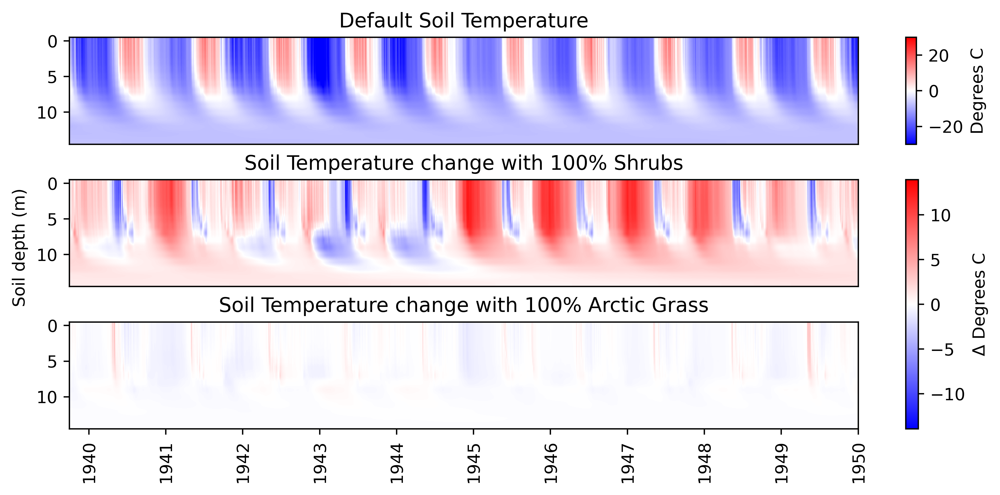

In [22]:
var = "TSOI"

fig, ax = plt.subplots(3, figsize = [8,4], dpi = 500, constrained_layout = True)
cmap = ax[0].imshow(np.transpose(baseline[var].squeeze().values - 273.15), aspect = 'auto', cmap = 'bwr', vmin = -30, vmax = 30)

dif1 = np.transpose(all_shrubs[var].squeeze().values) - np.transpose(baseline[var][:][:np.shape(all_shrubs[var])[0]].squeeze().values)
dif2 = np.transpose(no_shrubs[var][:][:np.shape(baseline[var])[0]].squeeze().values) - np.transpose(baseline[var][:][:np.shape(no_shrubs[var])[0]].squeeze().values)

d1min = np.abs(dif1.min())
d1max = dif1.max()
d2min = np.abs(dif2.min())
d2max = dif2.max()
vmax = np.max([d1min, d1max, d2min, d2max])
vmin = vmax * - 1


cmap2 = ax[1].imshow(dif1, aspect = 'auto', cmap = 'bwr', vmin = vmin, vmax = vmax)
ax[2].imshow(dif2, aspect = 'auto', cmap = 'bwr', vmin = vmin, vmax = vmax)
plt.colorbar(cmap, ax = ax[0], aspect = 10, label = 'Degrees C')
plt.colorbar(cmap2, ax = ax[1:3], label = 'Δ Degrees C')
ax[0].set_title('Default ' + elm_name_map[var])
ax[1].set_title(elm_name_map[var] + ' change with 100% Shrubs')
ax[2].set_title(elm_name_map[var] + ' change with 100% Arctic Grass')
ticks = np.arange(92, len(baseline.time + 92), 365)
ax[2].set_xticks(ticks)
ax[2].set_xticklabels(np.arange(0, len(ticks)) + 1940, rotation = 90)
for i in [0, 1]:
    ax[i].set_xticks([])
fig.text(-0.02, 0.5, 'Soil depth (m)', va='center', rotation='vertical')

## Plot soil temperature (basic %100 shrubs, with scaled precip. with scaled temp, with scaled precip. and temp)

Text(-0.02, 0.5, 'Soil depth (m)')

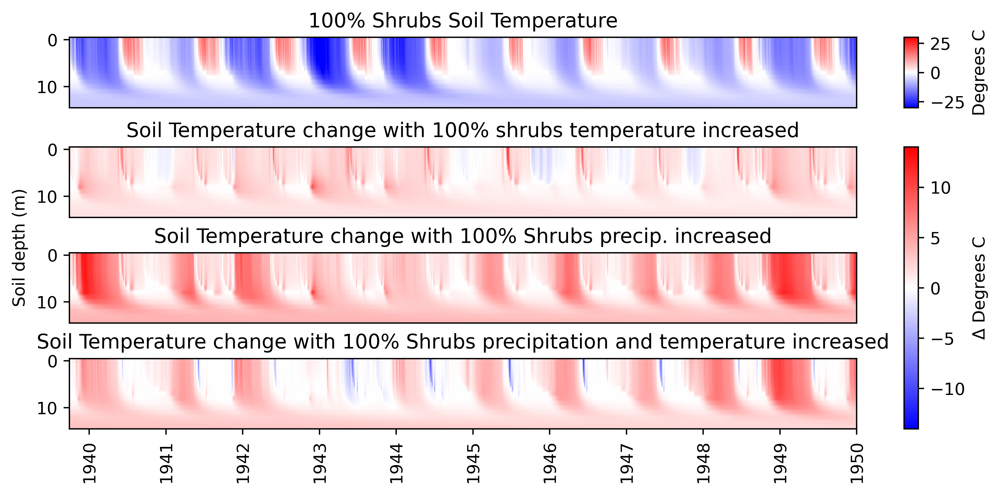

In [23]:
var = "TSOI"

fig, ax = plt.subplots(4, figsize = [8,4], dpi = 500, constrained_layout = True)
cmap = ax[0].imshow(np.transpose(all_shrubs[var].squeeze().values - 273.15), aspect = 'auto', cmap = 'bwr', vmin = -30, vmax = 30)
dif1 = np.transpose(temp_scale_shrubs[var].squeeze().values) - np.transpose(all_shrubs[var][:][:np.shape(temp_scale_shrubs[var])[0]].squeeze().values)
dif2 = np.transpose(rain_snow_scale_shrubs[var].squeeze().values) - np.transpose(all_shrubs[var][:][:np.shape(rain_snow_scale_shrubs[var])[0]].squeeze().values)
dif3 = np.transpose(temp_scale_rain_snow_scale_shrubs[var].squeeze().values) - np.transpose(all_shrubs[var][:][:np.shape(temp_scale_rain_snow_scale_shrubs[var])[0]].squeeze().values)

d1min = np.abs(dif1.min())
d1max = dif1.max()
d2min = np.abs(dif2.min())
d2max = dif2.max()
d3min = np.abs(dif3.min())
d3max = dif3.max()
vmax = np.max([d1min, d1max, d2min, d2max, d3min, d3max])
vmin = vmax * - 1

cmap2 = ax[1].imshow(dif1, aspect = 'auto', cmap = 'bwr', vmin = vmin, vmax = vmax)
ax[3].imshow(dif2, aspect = 'auto', cmap = 'bwr', vmin = vmin, vmax = vmax)
ax[2].imshow(dif3, aspect = 'auto', cmap = 'bwr', vmin = vmin, vmax = vmax)
plt.colorbar(cmap, ax = ax[0], aspect = 5, label = 'Degrees C')
plt.colorbar(cmap2, ax = ax[1:4], label = 'Δ Degrees C')
ax[0].set_title('100% Shrubs ' + elm_name_map[var])
ax[1].set_title(elm_name_map[var] + ' change with 100% shrubs temperature increased')
ax[2].set_title(elm_name_map[var] + ' change with 100% Shrubs precip. increased')
ax[3].set_title(elm_name_map[var] + ' change with 100% Shrubs precipitation and temperature increased')
ticks = np.arange(94, len(all_shrubs.time) + 94, 365)
ax[3].set_xticks(ticks)
ax[3].set_xticklabels(np.arange(0, len(ticks)) + 1940, rotation = 90)
for i in [0, 1, 2]:
    ax[i].set_xticks([])
fig.text(-0.02, 0.5, 'Soil depth (m)', va='center', rotation='vertical')

## Plot soil temperature (basic %100 arctic grass, with scaled precip. with scaled temp, with scaled precip. and temp)

Text(-0.02, 0.5, 'Soil depth (m)')

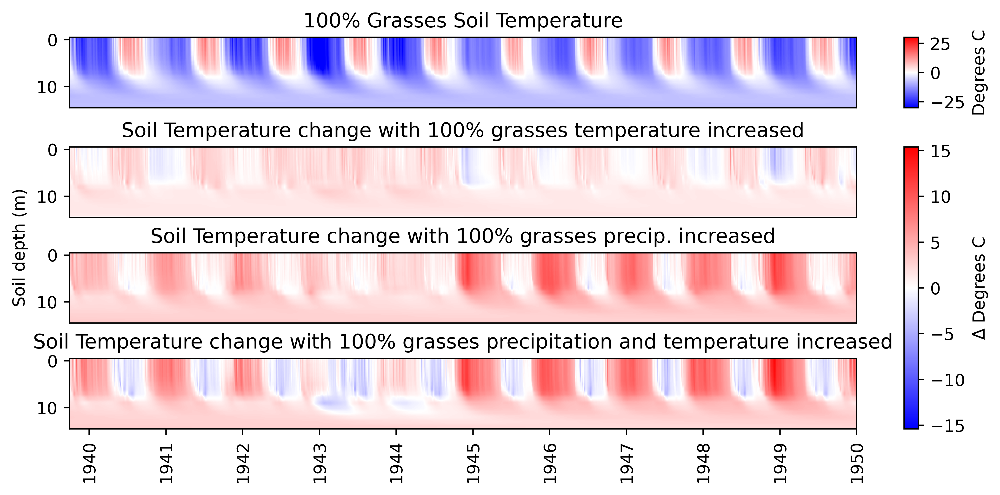

In [24]:
var = "TSOI"

fig, ax = plt.subplots(4, figsize = [8,4], dpi = 500, constrained_layout = True)
cmap = ax[0].imshow(np.transpose(no_shrubs[var].squeeze().values - 273.15), aspect = 'auto', cmap = 'bwr', vmin = -30, vmax = 30)
dif1 = np.transpose(temp_scale_no_shrubs[var].squeeze().values) - np.transpose(no_shrubs[var][:][:np.shape(temp_scale_no_shrubs[var])[0]].squeeze().values)
dif2 = np.transpose(rain_snow_scale_no_shrubs[var].squeeze().values) - np.transpose(no_shrubs[var][:][:np.shape(rain_snow_scale_no_shrubs[var])[0]].squeeze().values)
dif3 = np.transpose(temp_scale_rain_snow_scale_no_shrubs[var].squeeze().values) - np.transpose(no_shrubs[var][:][:np.shape(temp_scale_rain_snow_scale_no_shrubs[var])[0]].squeeze().values)

d1min = np.abs(dif1.min())
d1max = dif1.max()
d2min = np.abs(dif2.min())
d2max = dif2.max()
d3min = np.abs(dif3.min())
d3max = dif3.max()
vmax = np.max([d1min, d1max, d2min, d2max, d3min, d3max])
vmin = vmax * - 1

cmap2 = ax[1].imshow(dif1, aspect = 'auto', cmap = 'bwr', vmin = vmin, vmax = vmax)
ax[3].imshow(dif2, aspect = 'auto', cmap = 'bwr', vmin = vmin, vmax = vmax)
ax[2].imshow(dif3, aspect = 'auto', cmap = 'bwr', vmin = vmin, vmax = vmax)
plt.colorbar(cmap, ax = ax[0], aspect = 5, label = 'Degrees C')
plt.colorbar(cmap2, ax = ax[1:4], label = 'Δ Degrees C')
ax[0].set_title('100% Grasses ' + elm_name_map[var])
ax[1].set_title(elm_name_map[var] + ' change with 100% grasses temperature increased')
ax[2].set_title(elm_name_map[var] + ' change with 100% grasses precip. increased')
ax[3].set_title(elm_name_map[var] + ' change with 100% grasses precipitation and temperature increased')
ticks = np.arange(94, len(all_shrubs.time) + 94, 365)
ax[3].set_xticks(ticks)
ax[3].set_xticklabels(np.arange(0, len(ticks)) + 1940, rotation = 90)
for i in [0, 1, 2]:
    ax[i].set_xticks([])
fig.text(-0.02, 0.5, 'Soil depth (m)', va='center', rotation='vertical')

# Plot soil moisture (colorbar flipped from the above)

Text(-0.02, 0.5, 'Soil depth (m)')

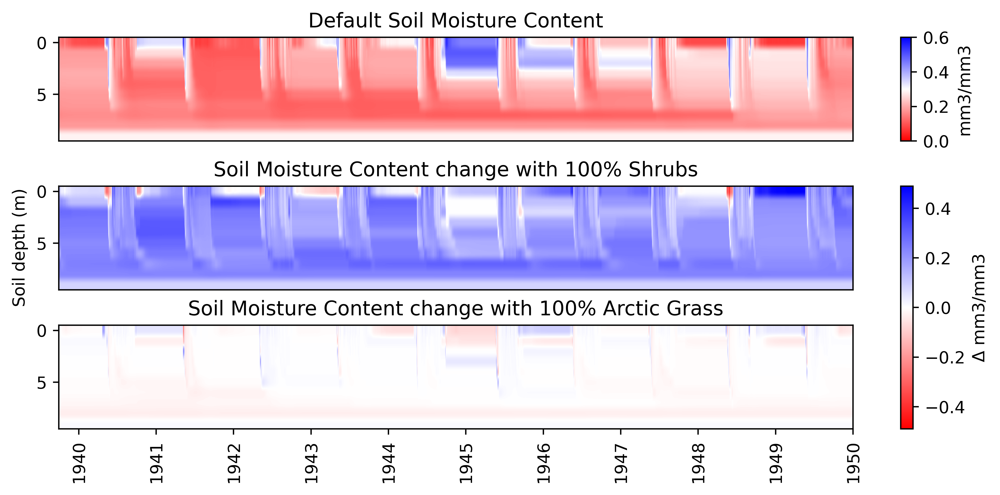

In [26]:
var = "H2OSOI"

nlev = 10
base = baseline[var].squeeze().isel(levgrnd=slice(0, nlev))
t1   = all_shrubs[var].squeeze().isel(levgrnd=slice(0, nlev))
t2   = no_shrubs[var].squeeze().isel(levgrnd=slice(0, nlev))

units = base.attrs.get("units", "")

fig, ax = plt.subplots(3, figsize=[8,4], dpi=500, constrained_layout=True)

cmap  = ax[0].imshow(base.values.T, aspect="auto", cmap="bwr_r", vmin = 0, vmax = 0.6)

d1 = (t1 - base).values
d2 = (t2 - base).values

# code to ensure the colorbar center value is at a neutral white color
d1min = np.abs(d1.min())
d1max = d1.max()
d2min = np.abs(d2.min())
d2max = d2.max()
vmax = np.max([d1min, d1max, d2min, d2max])
vmin = vmax * - 1

cmap2 = ax[1].imshow(d1.T, aspect="auto", cmap="bwr_r", vmin = vmin, vmax = vmax)
ax[2].imshow(d2.T, aspect="auto", cmap="bwr_r", vmin = vmin, vmax = vmax)

# one colorbar for absolute, one for diffs
plt.colorbar(cmap,  ax=ax[0], aspect=10, label=(units or None))
plt.colorbar(cmap2, ax=ax[1:4], label=("Δ " + units if units else None))

ax[0].set_title('Default ' + elm_name_map[var])
ax[1].set_title(elm_name_map[var] + ' change with 100% Shrubs')
ax[2].set_title(elm_name_map[var] + ' change with 100% Arctic Grass')

ticks = np.arange(94, len(all_shrubs.time) + 94, 365)
ax[2].set_xticks(ticks)
ax[2].set_xticklabels(np.arange(0, len(ticks)) + 1940, rotation = 90)
for i in [0, 1]:
    ax[i].set_xticks([])
fig.text(-0.02, 0.5, "Soil depth (m)", va="center", rotation="vertical")

## Plot soil moisture (basic %100 shrubs, with scaled precip. with scaled temp, with scaled precip. and temp)

Text(-0.02, 0.5, 'Soil depth (m)')

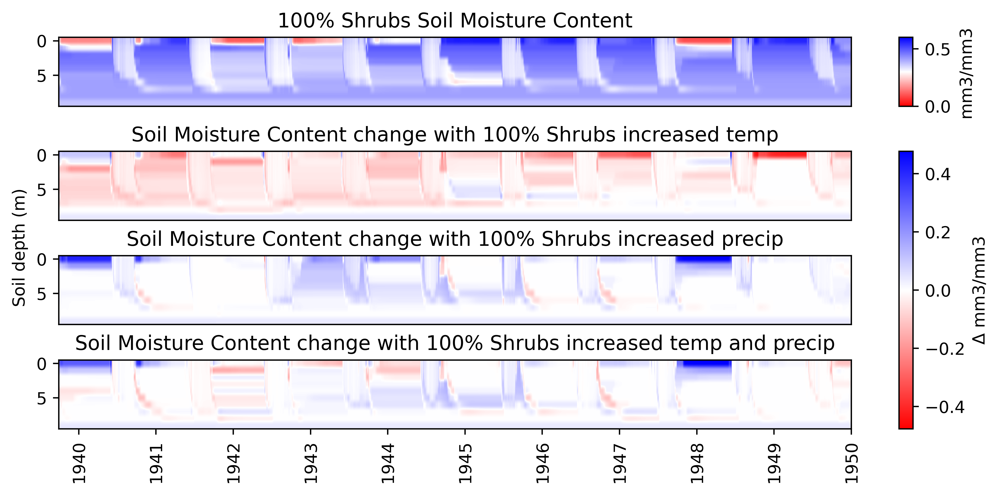

In [27]:
var = "H2OSOI"

nlev = 10
base = all_shrubs[var].squeeze().isel(levgrnd=slice(0, nlev))
t1   = temp_scale_shrubs[var].squeeze().isel(levgrnd=slice(0, nlev))
t2   = rain_snow_scale_shrubs[var].squeeze().isel(levgrnd=slice(0, nlev))
t3   = temp_scale_rain_snow_scale_shrubs[var].squeeze().isel(levgrnd=slice(0, nlev))

units = base.attrs.get("units", "")

fig, ax = plt.subplots(4, figsize=[8,4], dpi=500, constrained_layout=True)

cmap  = ax[0].imshow(base.values.T, aspect="auto", cmap="bwr_r", vmin = 0, vmax = 0.6)

d1 = (t1 - base).values
d2 = (t2 - base).values
d3 = (t3 - base).values

d1min = np.abs(d1.min())
d1max = d1.max()
d2min = np.abs(d2.min())
d2max = d2.max()
d3min = np.abs(d3.min())
d3max = d3.max()
vmax = np.max([d1min, d1max, d2min, d2max, d3min, d3max])
vmin = vmax * - 1


cmap2 = ax[1].imshow(d1.T, aspect="auto", cmap="bwr_r", vmin = vmin, vmax = vmax)
ax[2].imshow(d2.T, aspect="auto", cmap="bwr_r", vmin = vmin, vmax = vmax)
ax[3].imshow(d3.T, aspect="auto", cmap="bwr_r", vmin = vmin, vmax = vmax)

# one colorbar for absolute, one for diffs
plt.colorbar(cmap,  ax=ax[0], aspect=5, label=(units or None))
plt.colorbar(cmap2, ax=ax[1:4], label=("Δ " + units if units else None))

ax[0].set_title('100% Shrubs ' + elm_name_map[var])
ax[1].set_title(elm_name_map[var] + ' change with 100% Shrubs increased temp')
ax[2].set_title(elm_name_map[var] + ' change with 100% Shrubs increased precip')
ax[3].set_title(elm_name_map[var] + ' change with 100% Shrubs increased temp and precip')

ticks = np.arange(94, len(all_shrubs.time) + 94, 365)
ax[3].set_xticks(ticks)
ax[3].set_xticklabels(np.arange(0, len(ticks)) + 1940, rotation = 90)
for i in [0, 1, 2]:
    ax[i].set_xticks([])


fig.text(-0.02, 0.5, "Soil depth (m)", va="center", rotation="vertical")

## Plot soil moisture (basic %100 arctic grasses, with scaled precip. with scaled temp, with scaled precip. and temp)

Text(-0.02, 0.5, 'Soil depth (m)')

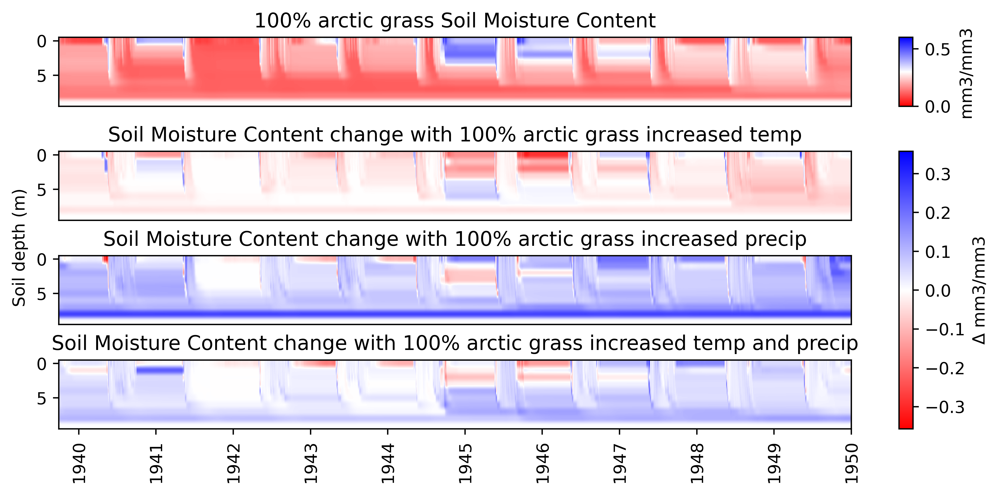

In [28]:
var = "H2OSOI"

nlev = 10
base = no_shrubs[var].squeeze().isel(levgrnd=slice(0, nlev))
t1   = temp_scale_no_shrubs[var].squeeze().isel(levgrnd=slice(0, nlev))
t2   = rain_snow_scale_no_shrubs[var].squeeze().isel(levgrnd=slice(0, nlev))
t3   = temp_scale_rain_snow_scale_no_shrubs[var].squeeze().isel(levgrnd=slice(0, nlev))

units = base.attrs.get("units", "")

fig, ax = plt.subplots(4, figsize=[8,4], dpi=500, constrained_layout=True)

cmap  = ax[0].imshow(base.values.T, aspect="auto", cmap="bwr_r", vmin = 0, vmax = 0.6)

d1 = (t1 - base).values
d2 = (t2 - base).values
d3 = (t3 - base).values


d1min = np.abs(d1.min())
d1max = d1.max()
d2min = np.abs(d2.min())
d2max = d2.max()
d3min = np.abs(d3.min())
d3max = d3.max()
vmax = np.max([d1min, d1max, d2min, d2max, d3min, d3max])
vmin = vmax * - 1


cmap2 = ax[1].imshow(d1.T, aspect="auto", cmap="bwr_r", vmin = vmin, vmax = vmax)
ax[2].imshow(d2.T, aspect="auto", cmap="bwr_r", vmin = vmin, vmax = vmax)
ax[3].imshow(d3.T, aspect="auto", cmap="bwr_r", vmin = vmin, vmax = vmax)

# one colorbar for absolute, one for diffs
plt.colorbar(cmap,  ax=ax[0], aspect=5, label=(units or None))
plt.colorbar(cmap2, ax=ax[1:4], label=("Δ " + units if units else None))

ax[0].set_title('100% arctic grass ' + elm_name_map[var])
ax[1].set_title(elm_name_map[var] + ' change with 100% arctic grass increased temp')
ax[2].set_title(elm_name_map[var] + ' change with 100% arctic grass increased precip')
ax[3].set_title(elm_name_map[var] + ' change with 100% arctic grass increased temp and precip')

ticks = np.arange(94, len(all_shrubs.time) + 94, 365)
ax[3].set_xticks(ticks)
ax[3].set_xticklabels(np.arange(0, len(ticks)) + 1940, rotation = 90)
for i in [0, 1, 2]:
    ax[i].set_xticks([])

fig.text(-0.02, 0.5, "Soil depth (m)", va="center", rotation="vertical")